This notebook introduces each of the texture in Augraphy's TextureGenerator. Right now it supports texture generation in grayscale only.


### Section 1:

1. "normal" texture.
2. "strange" texture
3. "rough_stains" texture.
4. "fine_stains" texture.
5. "severe_stains" texture.
6. "light_stains" texture.
7. "random_pattern" texture.
8. "dot_granular" texture.
9. "light_granular" texture.
10. "rough_granular" texture.
11. "curvy_edge" texture.
12. "broken_edge" texture.


In [1]:
# Installation of Augraphy

!pip install git+https://github.com/sparkfish/augraphy


  Cloning https://github.com/sparkfish/augraphy to /tmp/pip-req-build-s1k2g38m
  Running command git clone --filter=blob:none --quiet https://github.com/sparkfish/augraphy /tmp/pip-req-build-s1k2g38m
  Resolved https://github.com/sparkfish/augraphy to commit 9b51cf42fc21243871528a8ff25f7cc905cb2a57
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for augraphy: filename=augraphy-8.2.4-py3-none-any.whl size=203140 sha256=fbbe7b495371b86eb6caf60c71a4202f8a946681a8caadfbdbbd9a955b99a681
  Stored in directory: /tmp/pip-ephem-wheel-cache-ww3biuu1/wheels/36/d0/21/1aa9ab43fc6934decc10b8a3b839a472b0fed7d3d185b90d51
Successfully built augraphy


In [2]:
# Import libraries

from augraphy import *
import random
import numpy as np
import cv2
import gdown
import os
import zipfile
from glob import glob
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [10, 8]

In [3]:
# Initialize texture generator object

texture_generator = TextureGenerator()

## 1. "normal" texture.

The "normal" texture is generated by adding multiple iteration of normal distribution noise. It produces a background filled with multiple dark spots creating a dirty background similar texture.

The method is referencing this discussion in generating the texture:
https://stackoverflow.com/questions/51646185/how-to-generate-a-paper-like-background-with-opencv

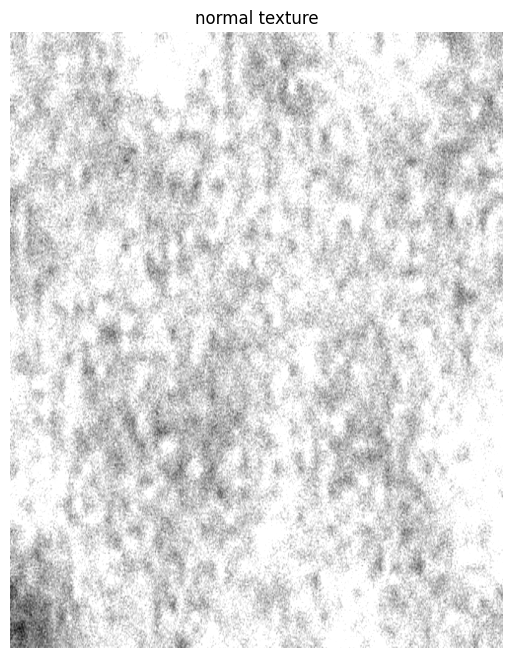

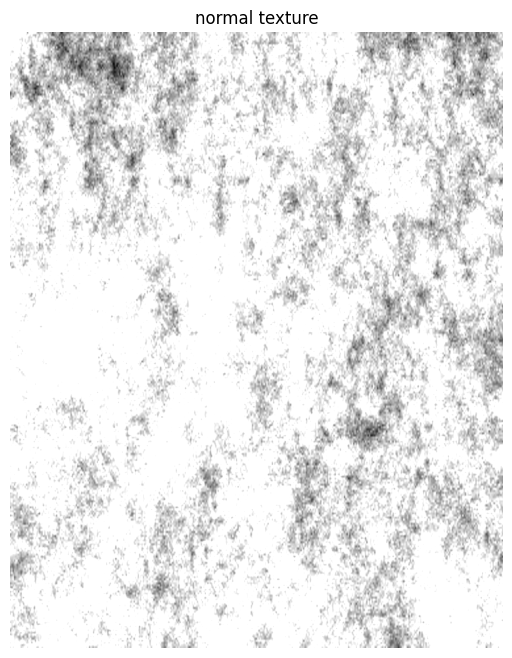

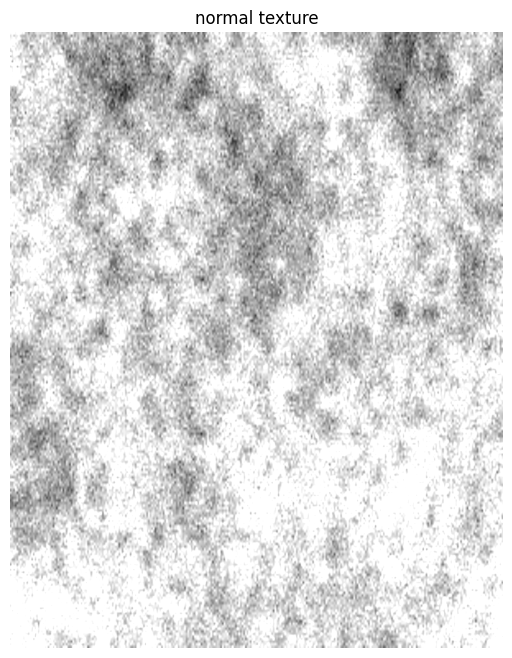

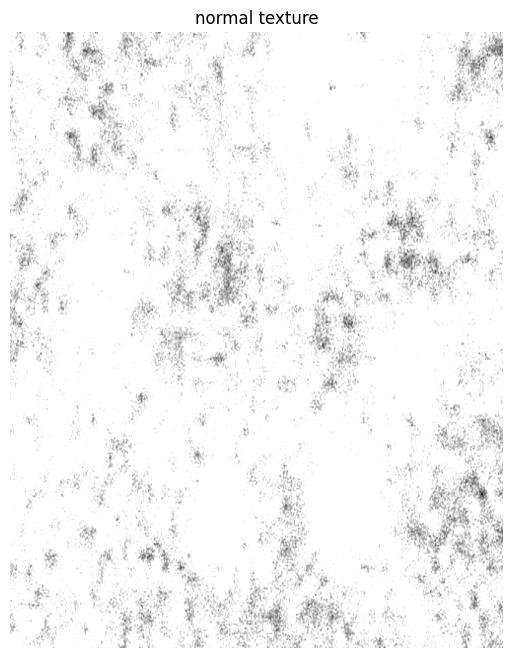

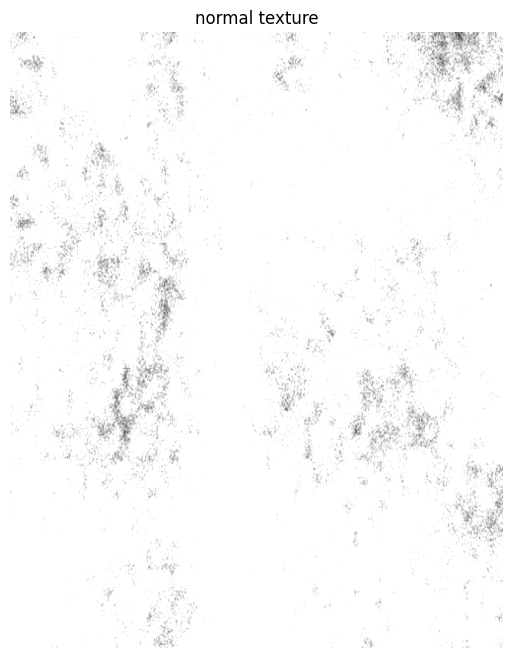

In [ ]:
# Examples

for i in range(5):
    image_texture = texture_generator(texture_type="normal", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("normal texture")
    plt.axis('off')


## 2. "strange" texture.
The "strange" texture produces a dark complex background texture in a consistent pattern.

The texture is generated by using the algorithm in this repository:
https://github.com/NewYaroslav/strange_pattern

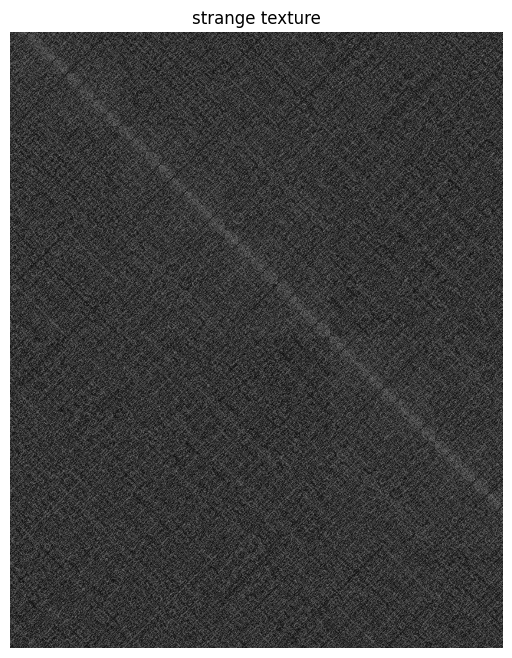

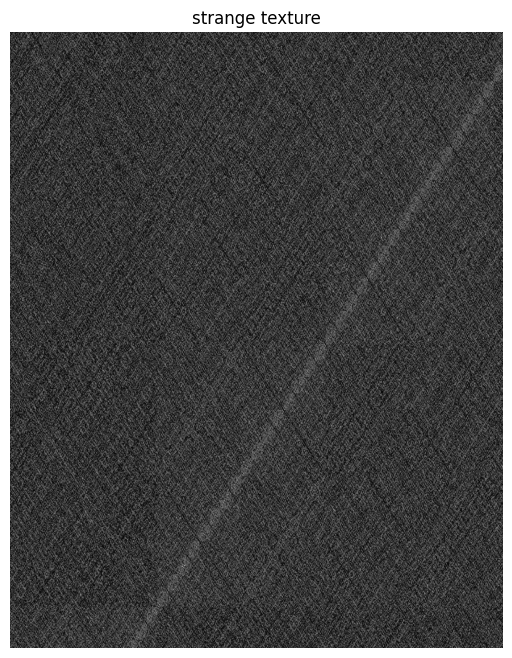

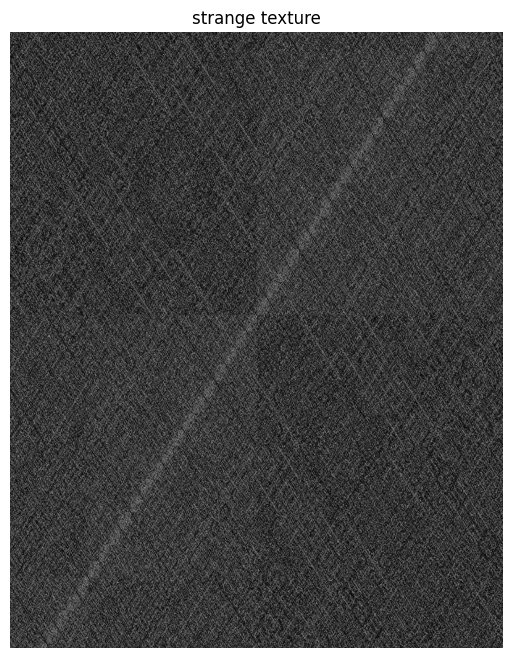

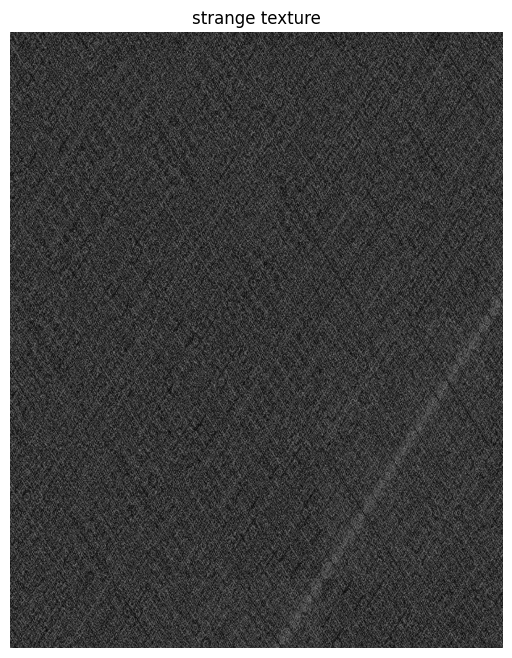

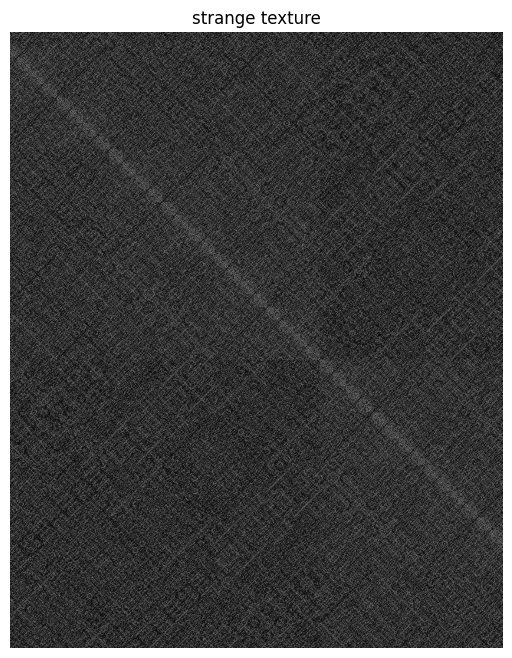

In [ ]:
# Examples

for i in range(5):
    image_texture = texture_generator(texture_type="strange", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("strange texture")
    plt.axis('off')


## 3. "rough_stains" texture.
The "rough_stains" creates a texture similar to dry stains on paper. In this method, the stains appear larger and  rougher compare to the other stains based texture.

There are several steps in generating "rough_stains" texture. Initially multiple sine and cosine waves with random amplitude, phase, frequency are combined to create a wavy pattern. Then, image is converted into frequency domain by using FFT, followed by center shifting of zero-frequency components. After this shifting, low frequency area is removed to enable a distinct stains effect. Once the low frequency area is removed, the image is converted back to spatial domain using IFFT. The image is further processed by a median filter to allow a more realistic effect.

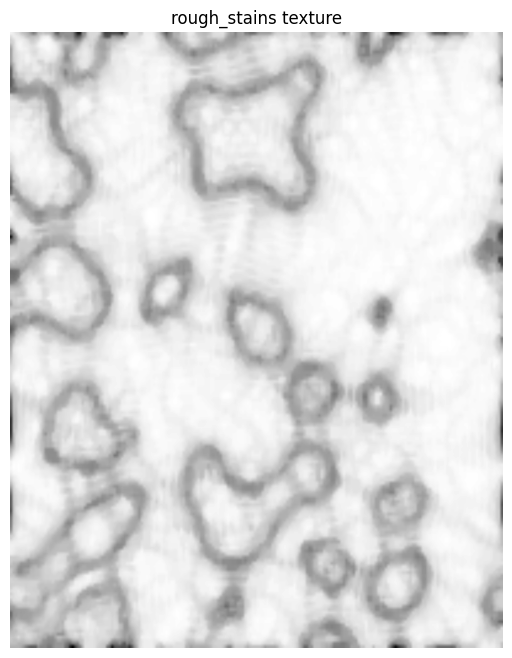

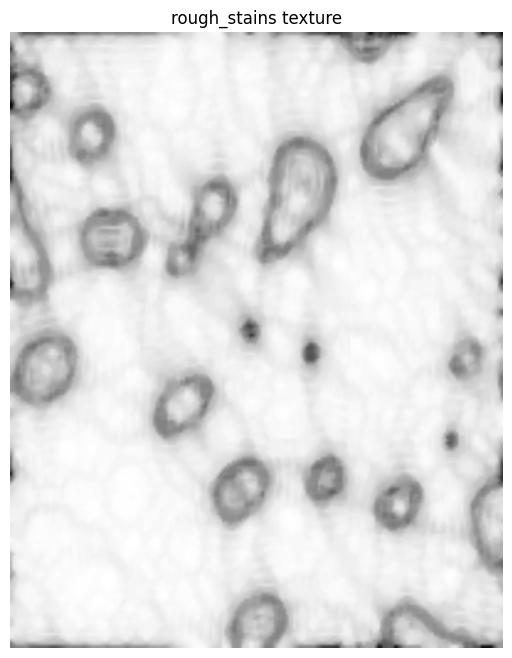

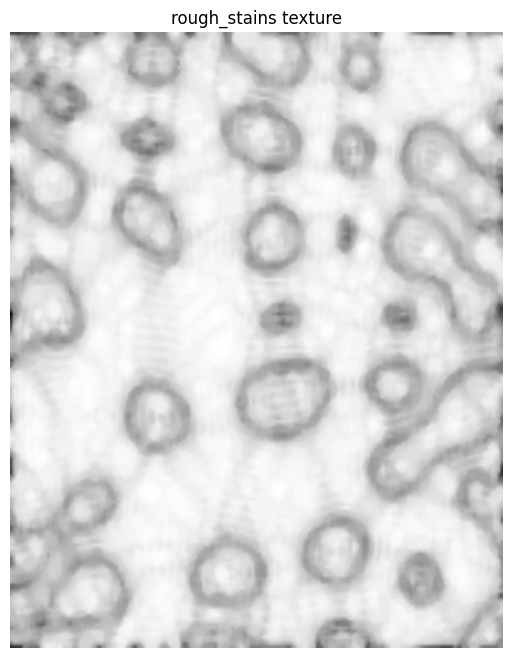

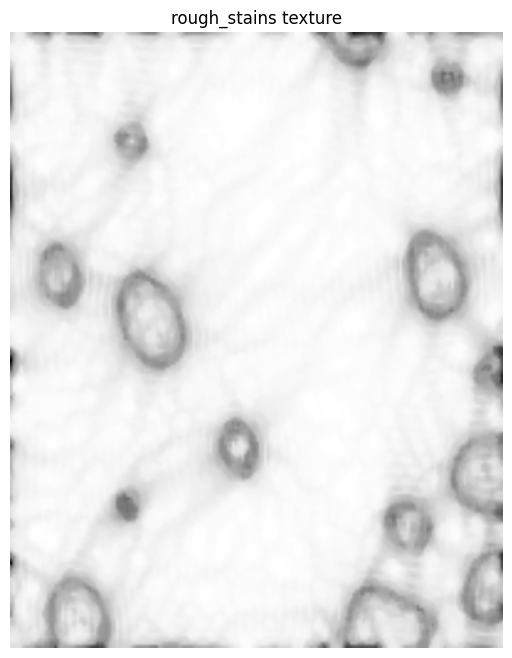

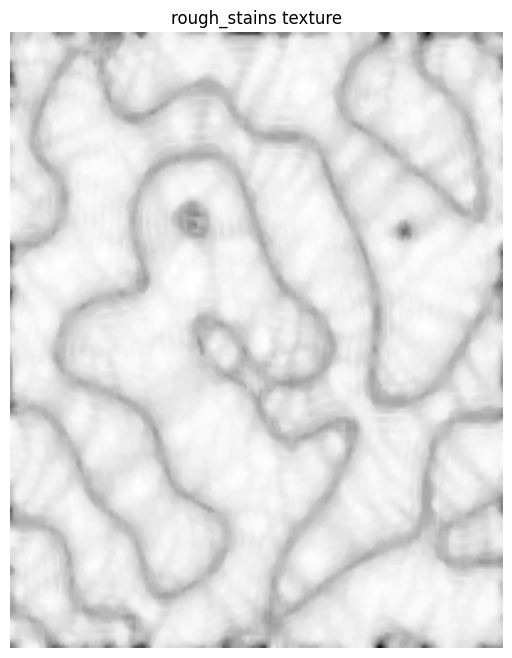

In [ ]:
# Examples

for i in range(5):
    image_texture = texture_generator(texture_type="rough_stains", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("rough_stains texture")
    plt.axis('off')


## 4. "fine_stains" texture.
The "fine_stains" creates a texture similar to dry stains on paper. In this method, the stains texture looks finer and smaller compare to the other stains based texture.

The steps in generating "fine_stains" texture is similar to "rough_stains" texture, except it removes different frequency area and it removes low frequency area twice.

In the first frequency removal step, it removes a lower frequency area to preserve more information and only noises are removed. In the second frequency removal step, it removes a higher range of frequency area to enable a more distinct and finer edge in the stains effect.

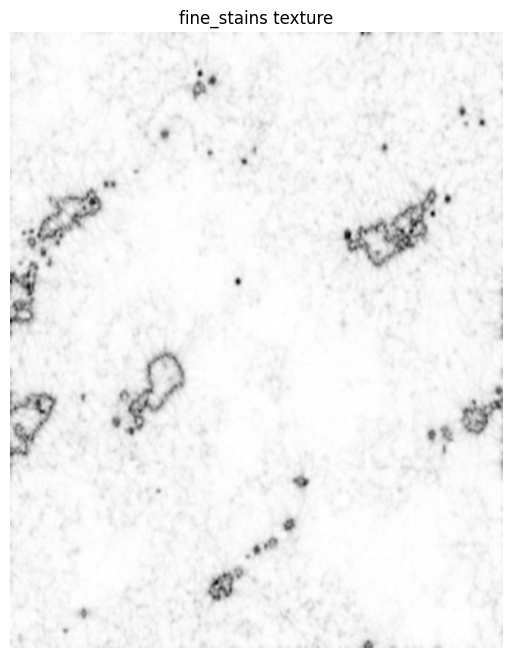

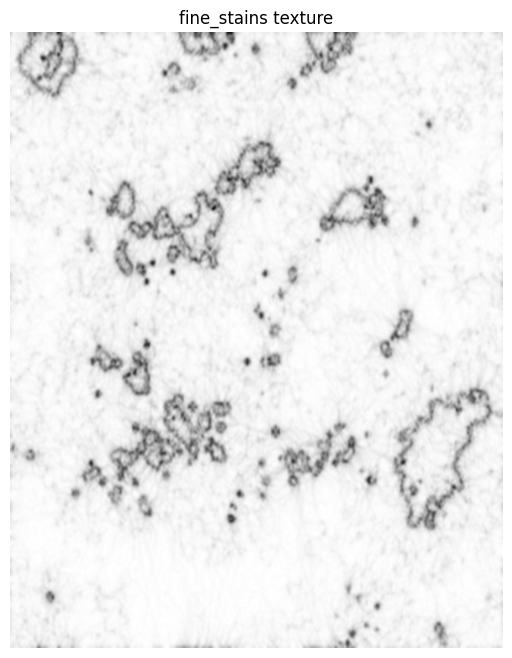

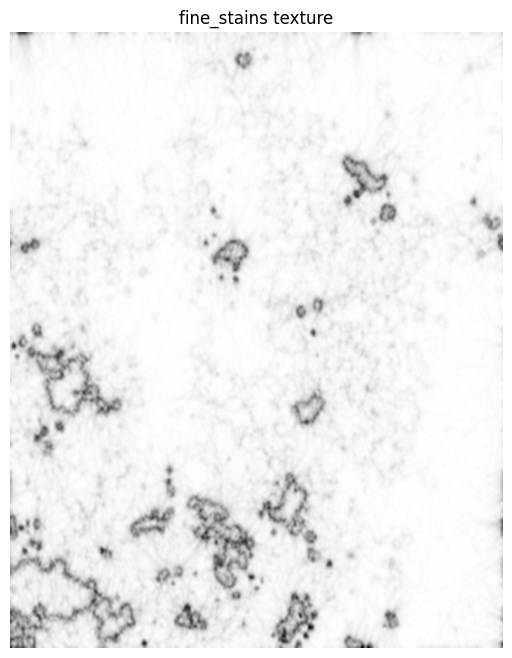

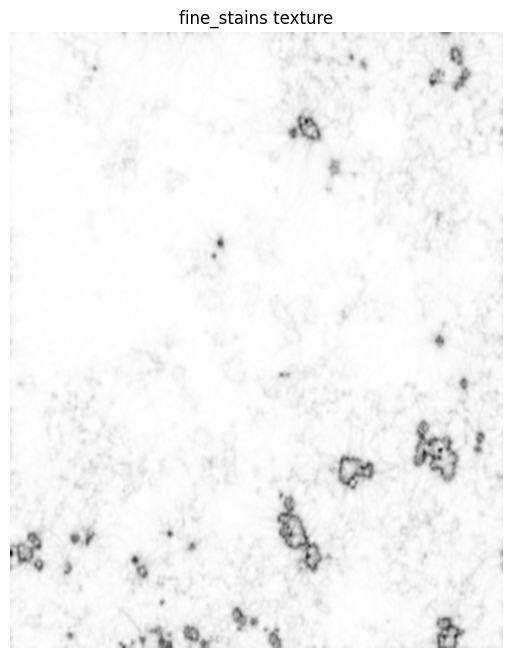

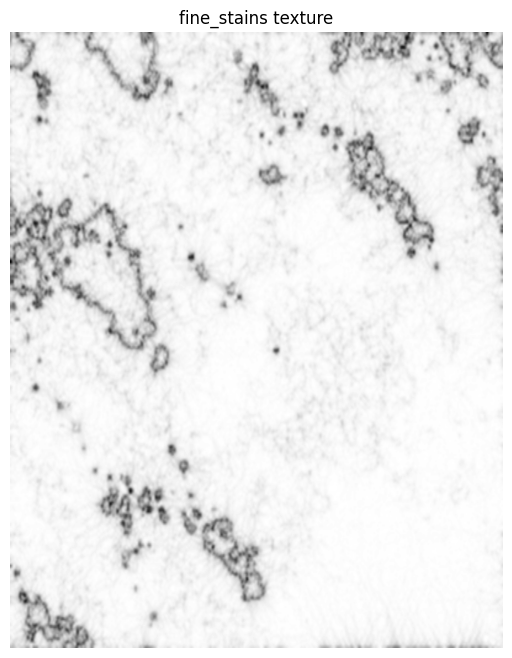

In [ ]:
# Examples

for i in range(5):
    image_texture = texture_generator(texture_type="fine_stains", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("fine_stains texture")
    plt.axis('off')


## 5. "severe_stains" texture.
The "severe_stains" creates a texture similar to a severely damaged paper.

"severe_stains" texture is generated by merging both "rough_stains" and "fine_stains" texture, creating a rougher and noisier effect within the stains.

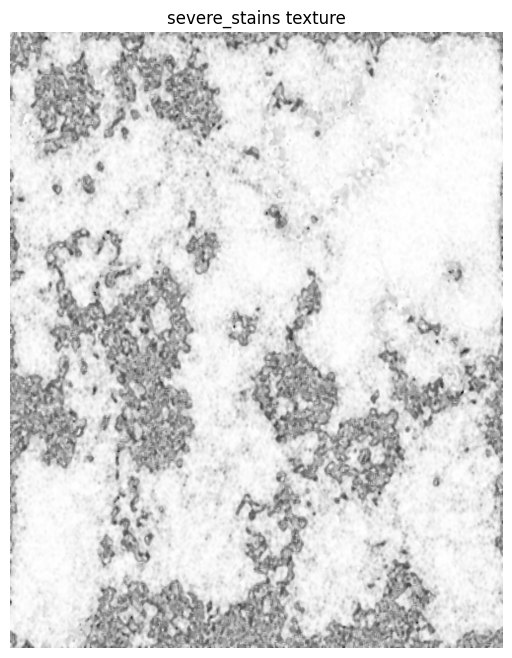

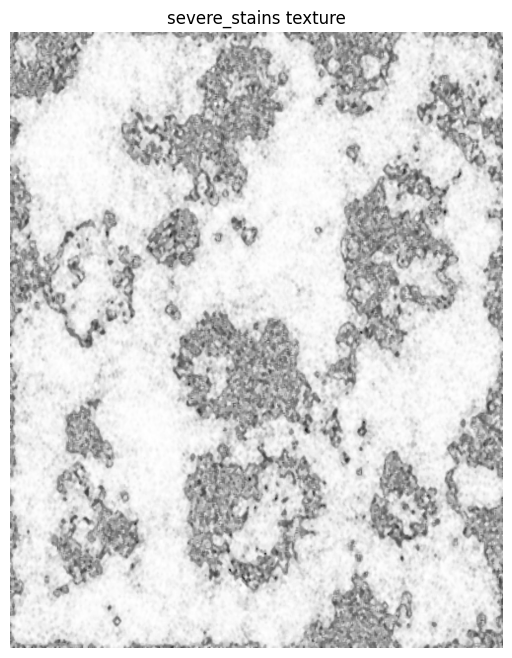

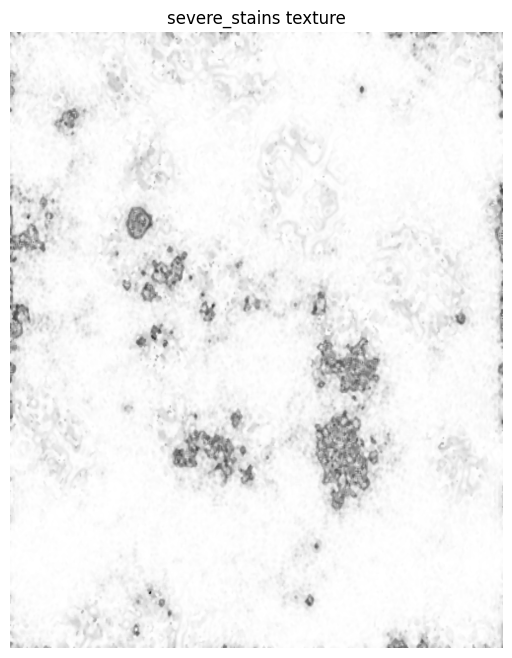

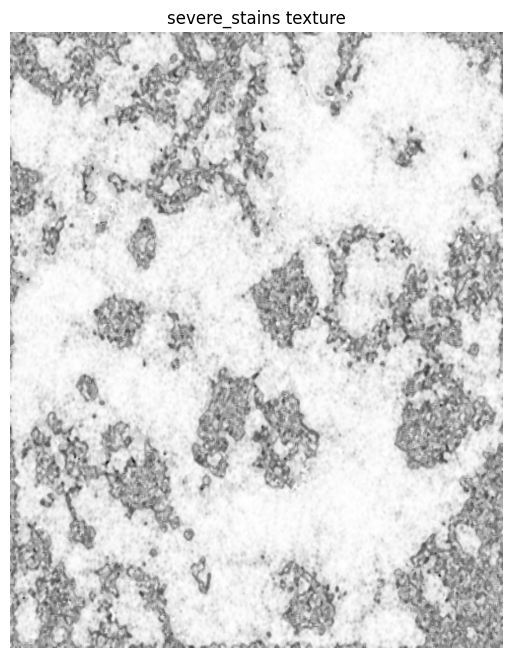

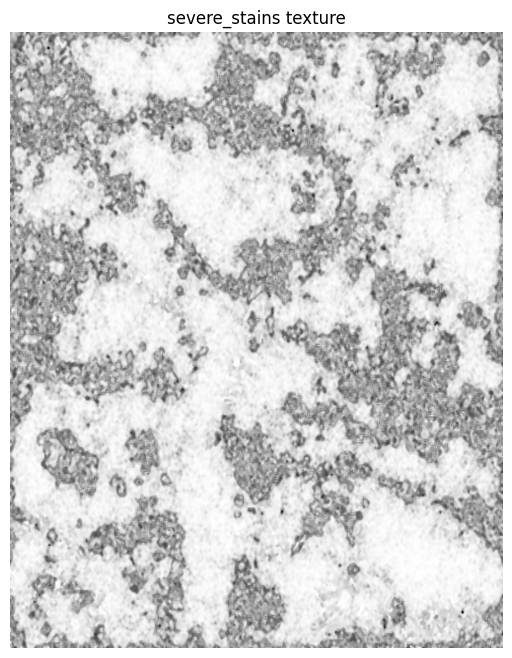

In [ ]:
# Examples

for i in range(5):
    image_texture = texture_generator(texture_type="severe_stains", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("severe_stains texture")
    plt.axis('off')


### 6. "light_stains" texture.
The "light_stains" creates a subtle stains texture across the entire image.

"light_stains" texture generation involves several steps. In the first step, numerous block of image area are randomly selected to fill in random intensity value. The process is followed by a median filter process to smoothen the block. Then, image is converted to frequency domain and low frequency area is removed to create a stains effect. In the last step, the image is further brightened to create a more realistic effect.

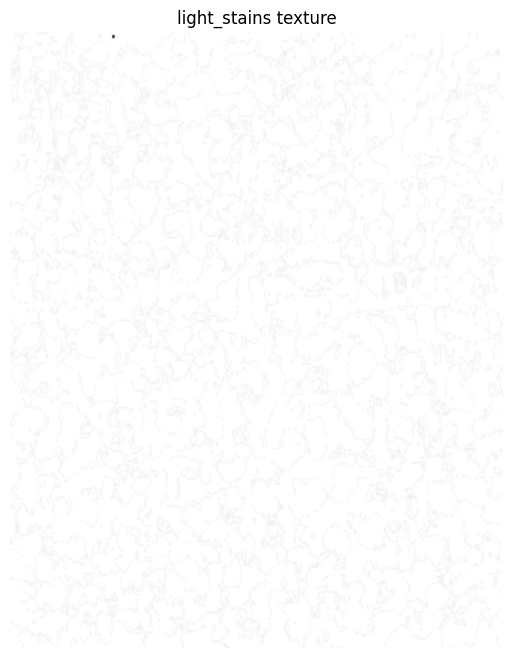

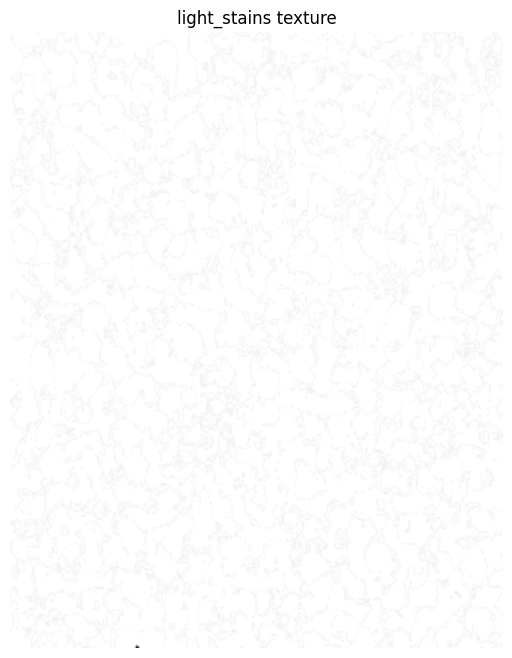

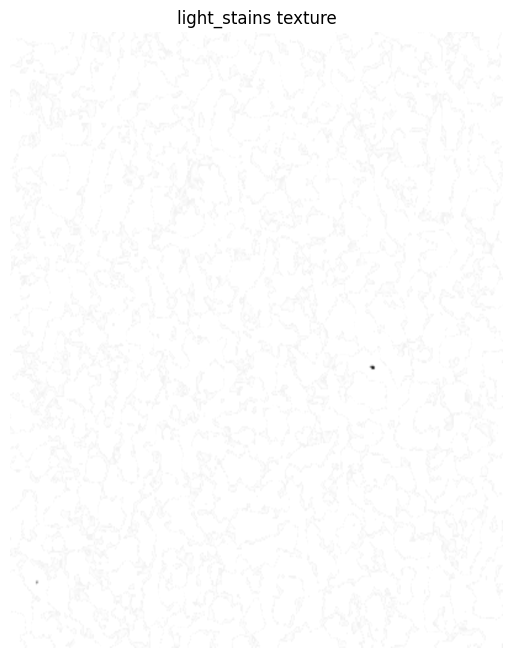

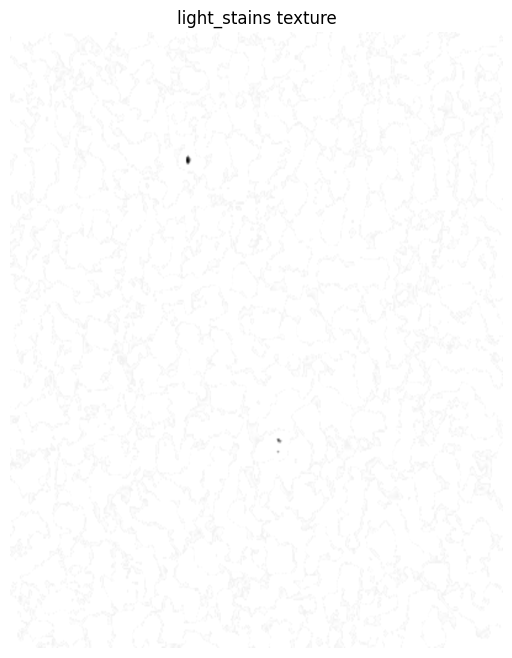

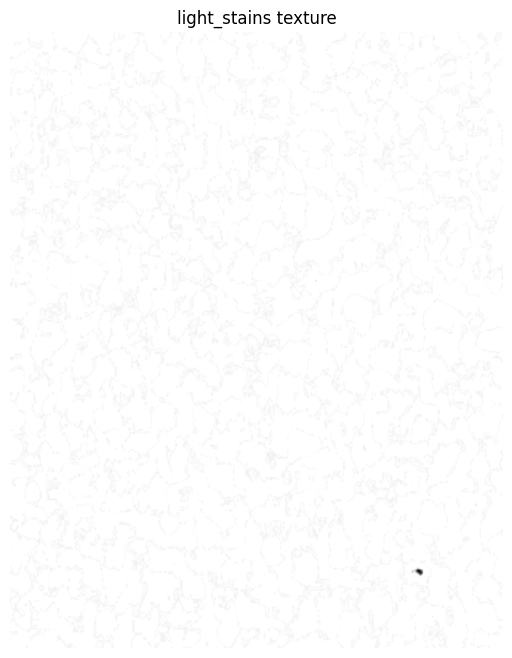

In [ ]:
# Examples

for i in range(5):
    image_texture = texture_generator(texture_type="light_stains", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("light_stains texture")
    plt.axis('off')

### 7. "random_pattern" texture.
The "random_pattern" creates a subtle background pattern texture across the entire image.

Multiple steps are involved in generating "random_pattern" texture. Initially single sine and cosine waves with random amplitude, phase, frequency are combined to create a fixed pattern. Then, image is converted into frequency domain by using FFT, followed by the center shifting of zero-frequency components. After this shifting, low frequency area is removed twice, leaving only the distinct pattern in the image. In the next step, the image is converted back to spatial domain using IFFT. Finally, the image is further processed by a median filter to make it looks more realistic.

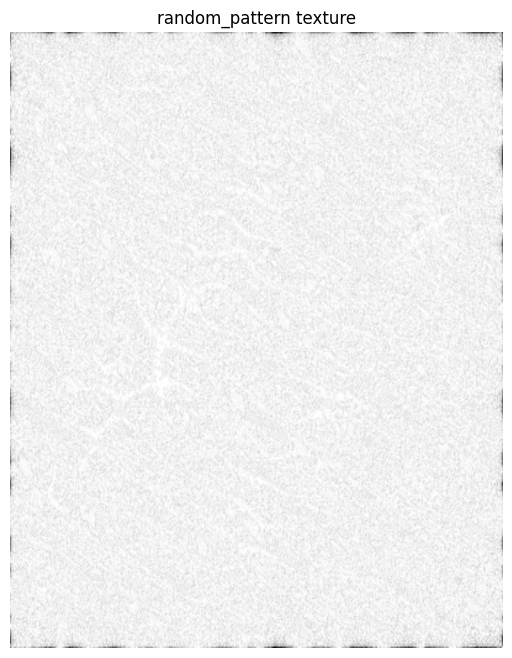

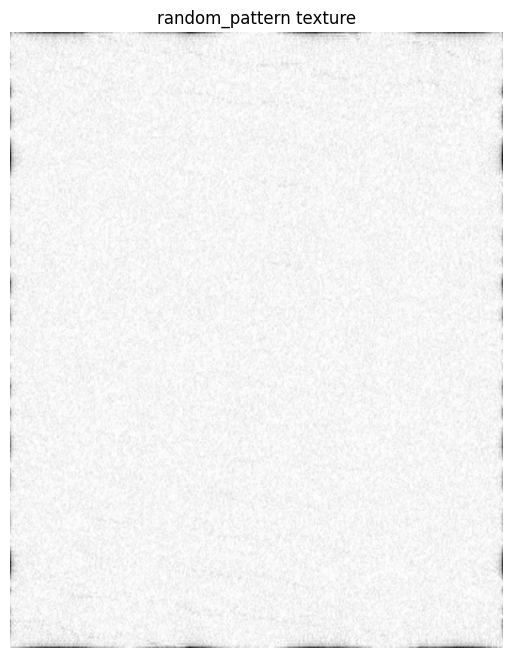

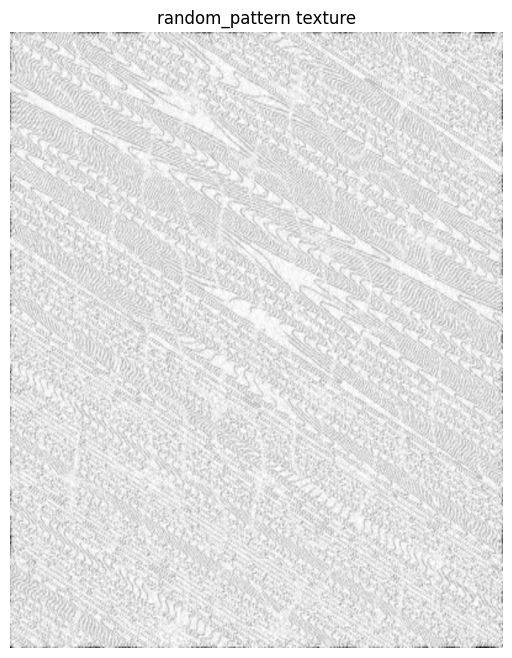

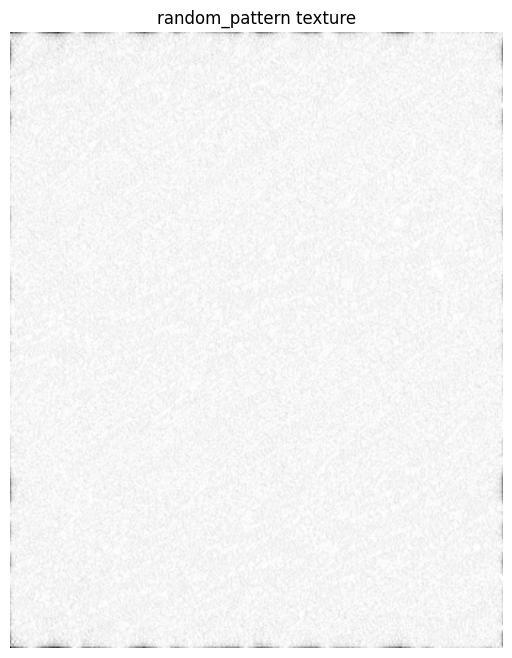

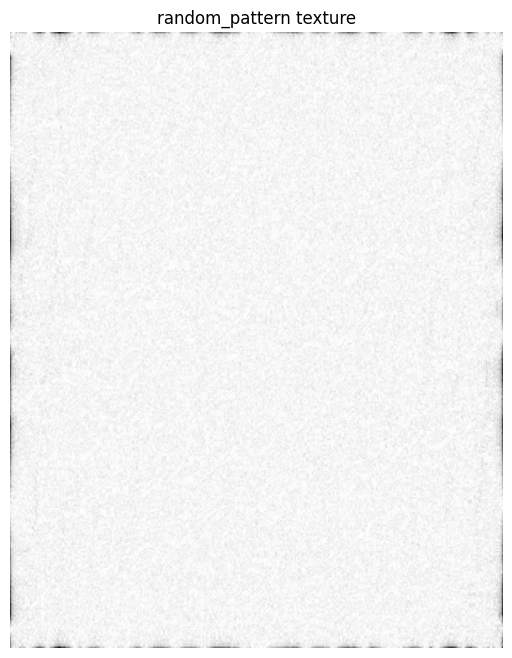

In [ ]:
# Example

for i in range(5):
    image_texture = texture_generator(texture_type="random_pattern", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("random_pattern texture")
    plt.axis('off')

### 8. "dot_granular" texture.
The "dot_granular" creates a distinct dot granular texture across the entire image.

The first step to generate "dot_granular" texture is drawing numerous small circle in the entire image. Then, the texture is further enhanced by summing image with images rotated in different angles. Image gradient magnitude of random direction is computed to create a realistic granular effect.


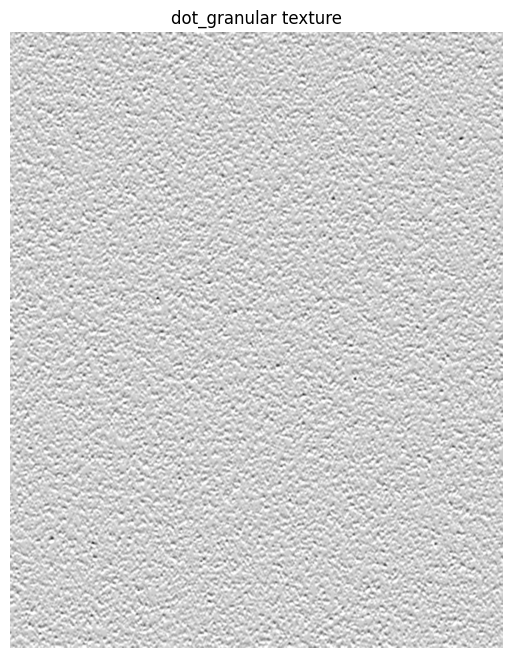

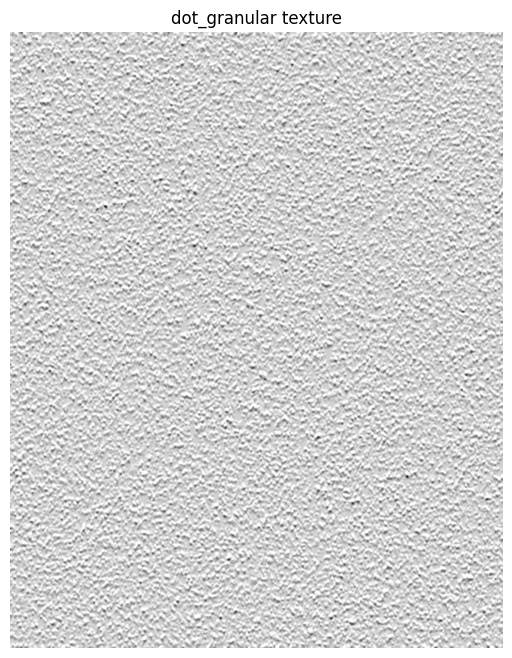

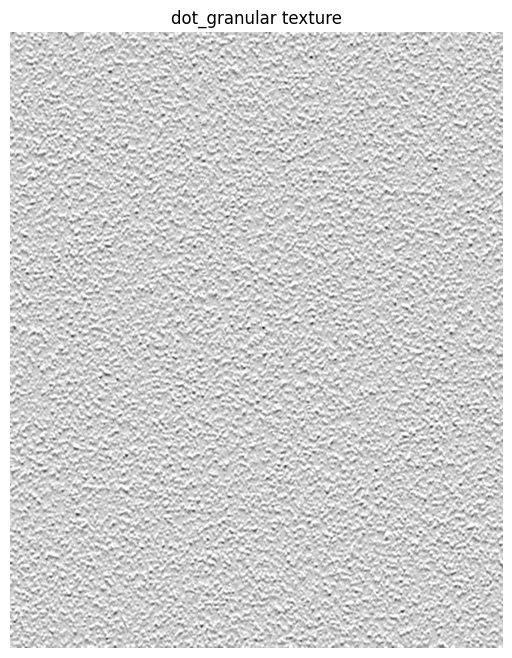

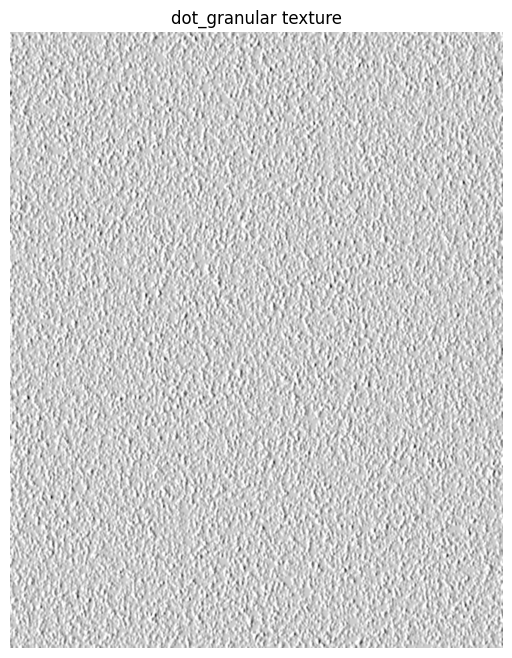

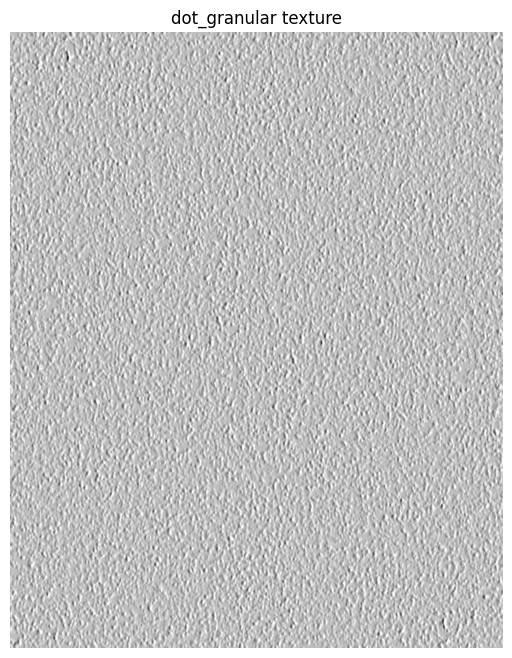

In [ ]:
# Examples

for i in range(5):
    image_texture = texture_generator(texture_type="dot_granular", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("dot_granular texture")
    plt.axis('off')

### 9. "light_granular" texture.
The "light_granular" creates a subtle granular texture across the entire image.

There are several steps involved in generating "light_granular" texture. First, multiple iterations of Gaussian noise are summed to create a random pattern in the image. Then, image is converted to frequency domain and low frequency area is removed to enhance the pattern texture. In the next step, image gradient magnitude of random direction is computed to create a realistic granular effect.

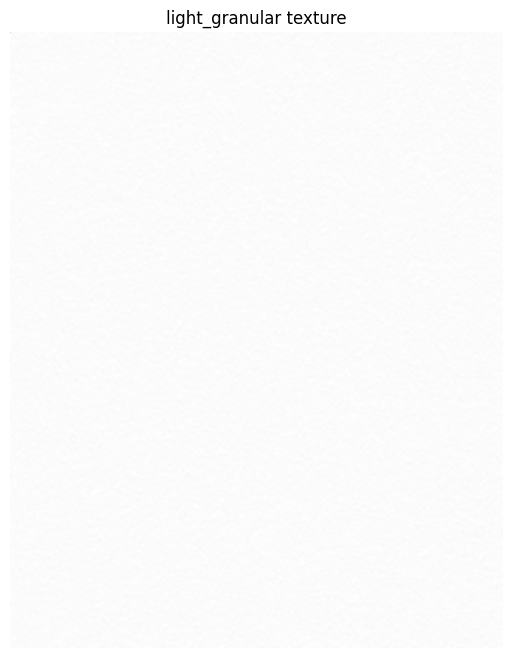

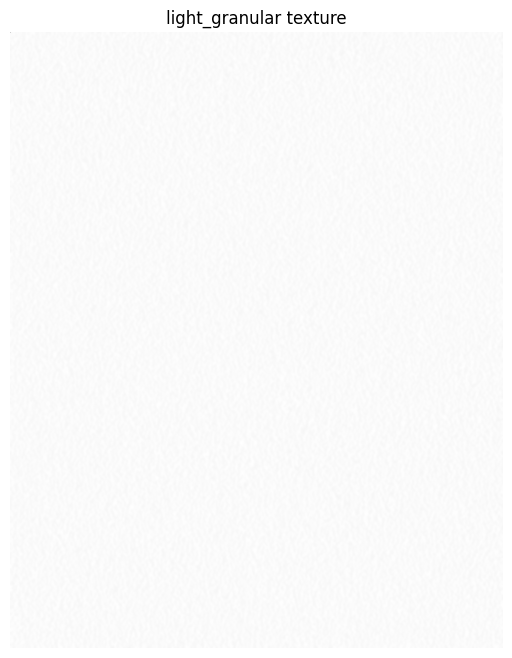

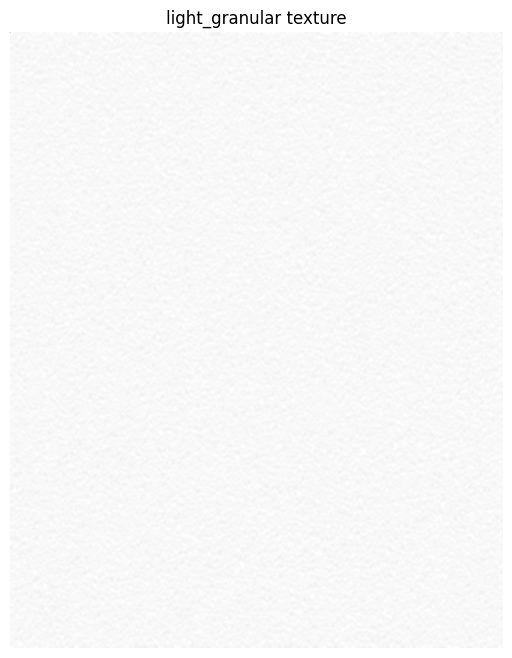

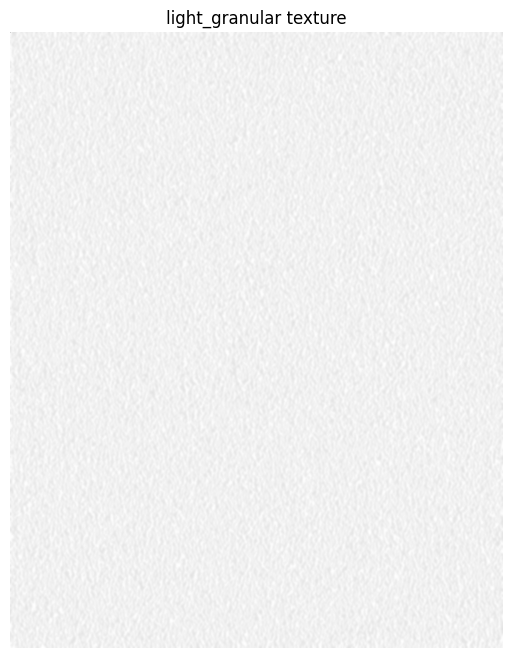

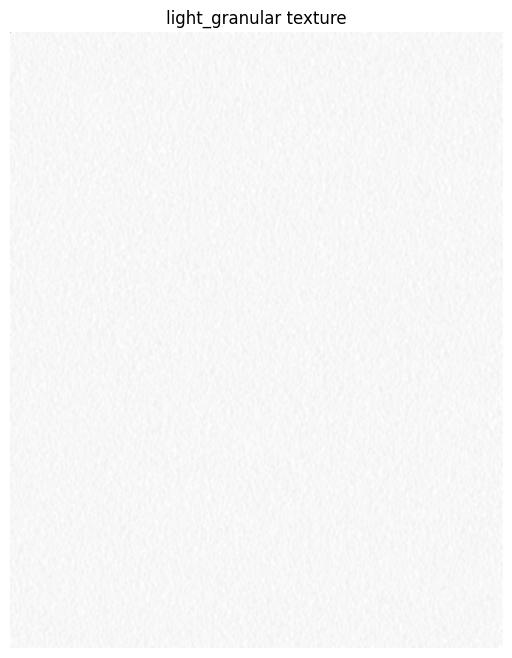

In [ ]:
# Example

for i in range(5):
    image_texture = texture_generator(texture_type="light_granular", texture_width=1200,texture_height=1500, quilt_texture=0)
    image_texture[0,0] = 0
    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("light_granular texture")
    plt.axis('off')

### 10. "rough_granular" texture.
The "rough_granular" creates a distinct, rough and noisy granular texture across the entire image.

The steps to generate "rough_granular" texture is similar to "dot_granular" texture, except it is drawing circles of different sizes. The circles are drawn in multiple iterations, where it draws circles from larger size to smaller size, creating a much more complex and noisy granular texture.

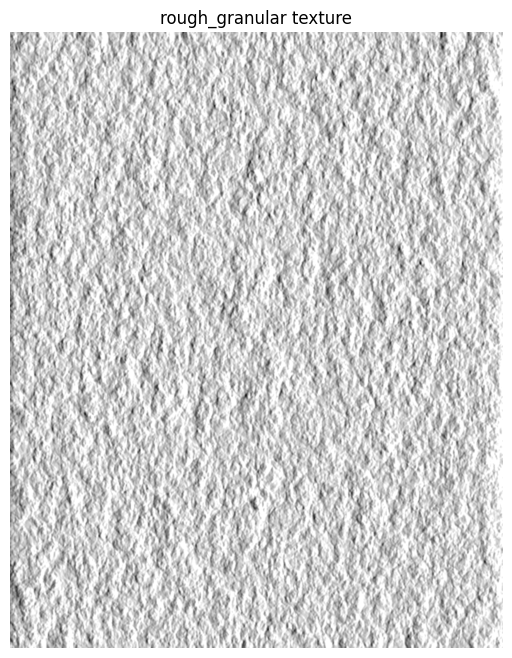

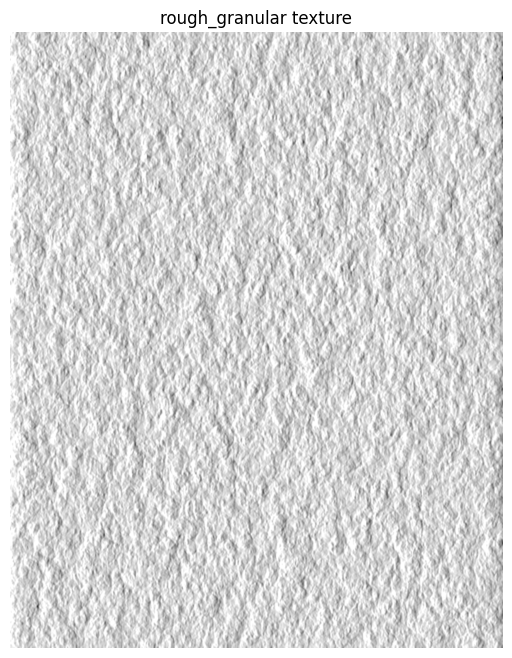

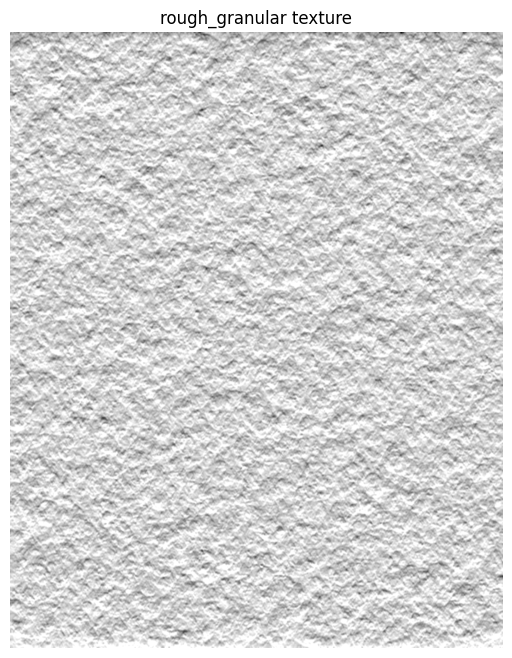

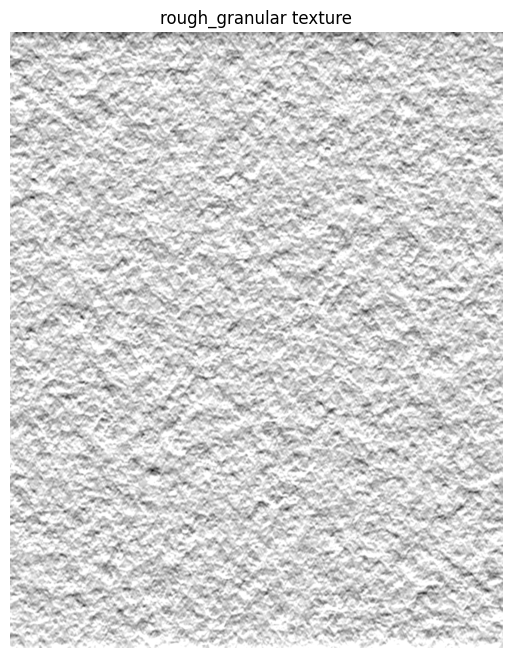

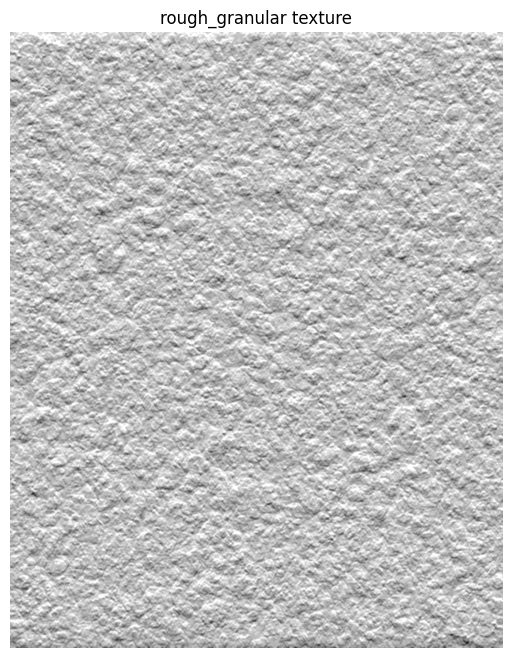

In [ ]:
# Example

for i in range(5):
    image_texture = texture_generator(texture_type="rough_granular", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("rough_granular texture")
    plt.axis('off')

### 11. "curvy_edge" texture.
The "curvy_edge" creates shadow along the image edges, creating a curvy border effect in the paper.

There are several steps in generating "curvy_edge" texture. Initially multiple sine and cosine waves with random amplitude, phase, frequency are combined to create a random pattern. Then, image is converted into frequency domain by using FFT, followed by center shifting of zero-frequency components. After this shifting, a range of high frequency area is removed to eliminate most of the texture, leaving only the distinct shadow effect in the borders. In the next step, the image is converted back to spatial domain using IFFT. The image is further processed by a Gaussian filter to allow a more realistic effect.

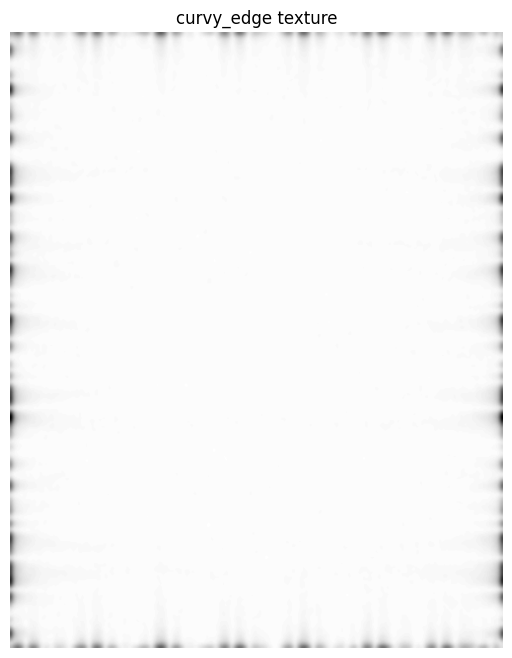

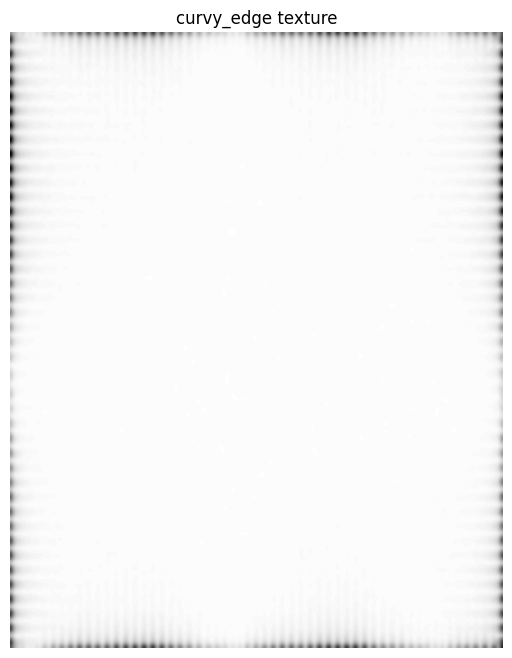

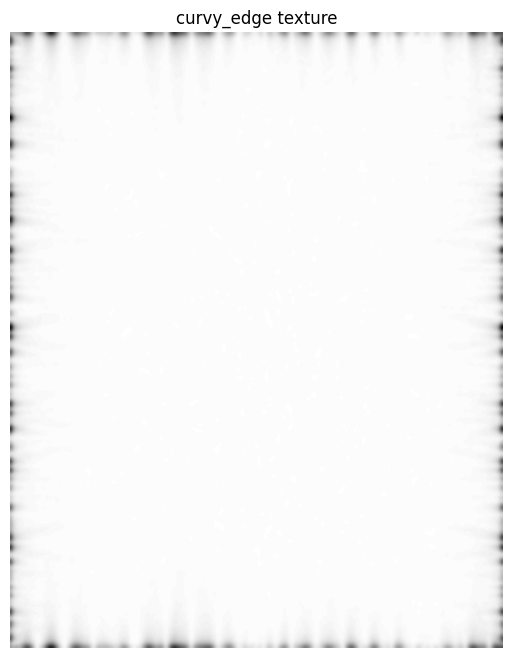

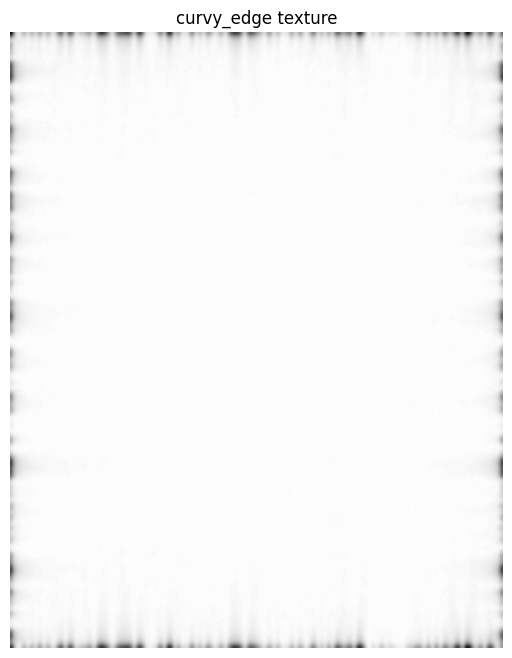

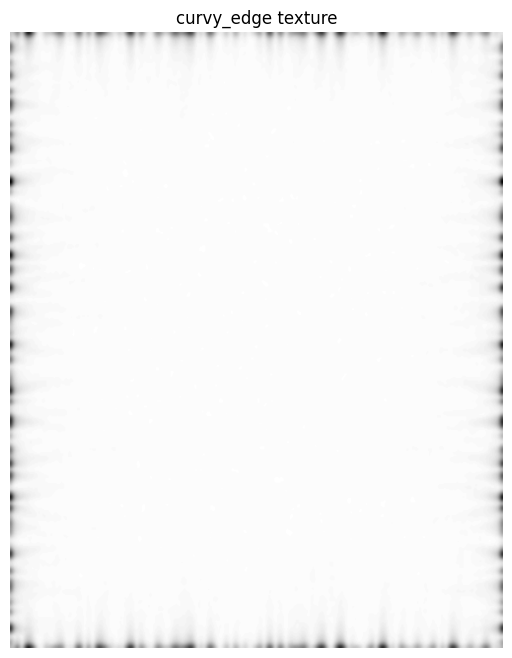

In [ ]:
# Example

for i in range(5):
    image_texture = texture_generator(texture_type="curvy_edge", texture_width=1200,texture_height=1500, quilt_texture=0)

    # display image
    plt.figure()
    plt.imshow(image_texture, cmap="gray")
    plt.title("curvy_edge texture")
    plt.axis('off')

### 12. "broken_edge" texture.
The "broken_edge" creates broken edges texture effect along the borders of the image.

The "broken_edge" texture is generated by combining 2 images. Each of these images is filled with clusters of blobs positioned along all four sides of the image. When these 2 images are summed, they create a "broken_edge" texture.

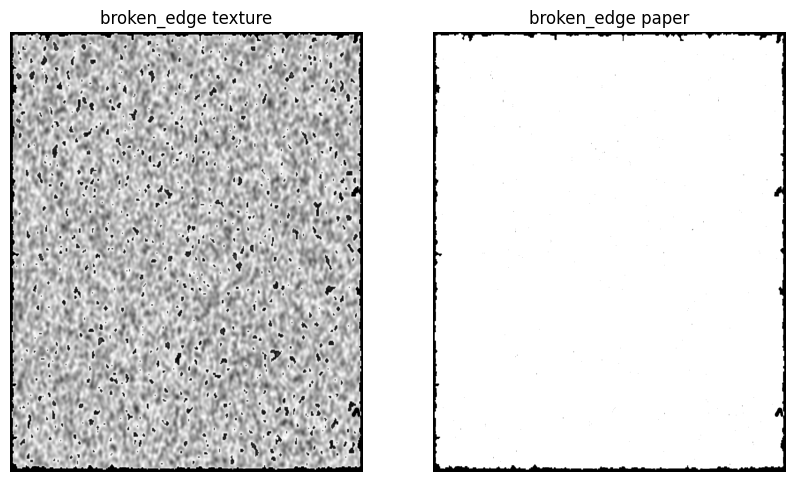

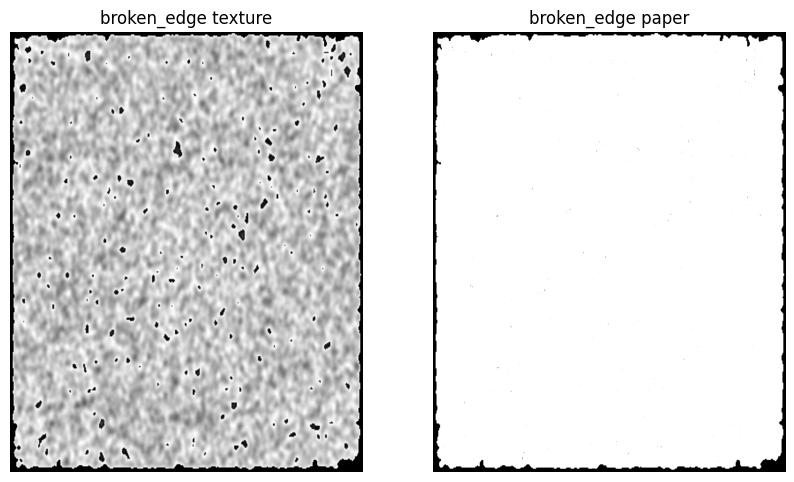

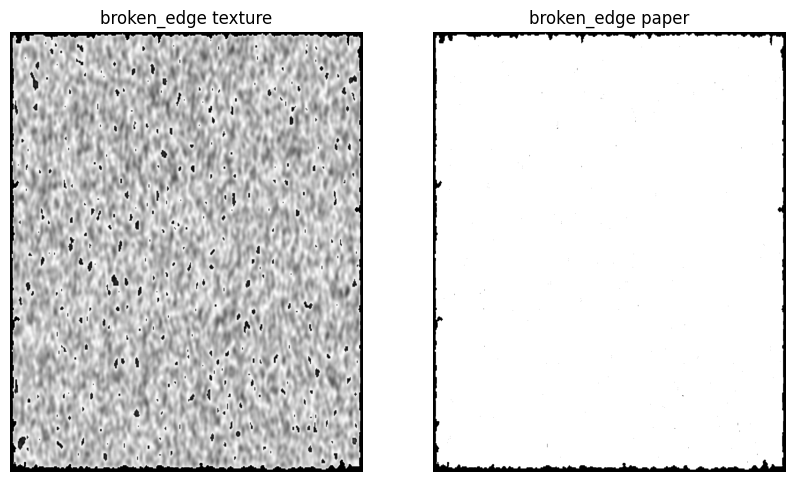

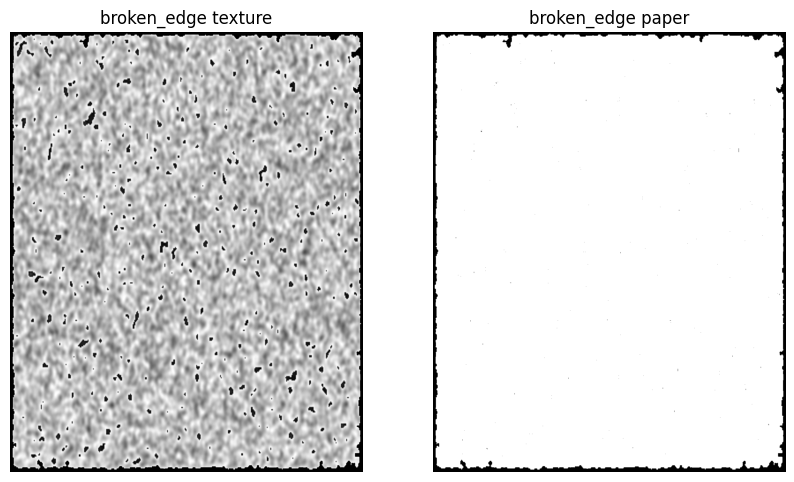

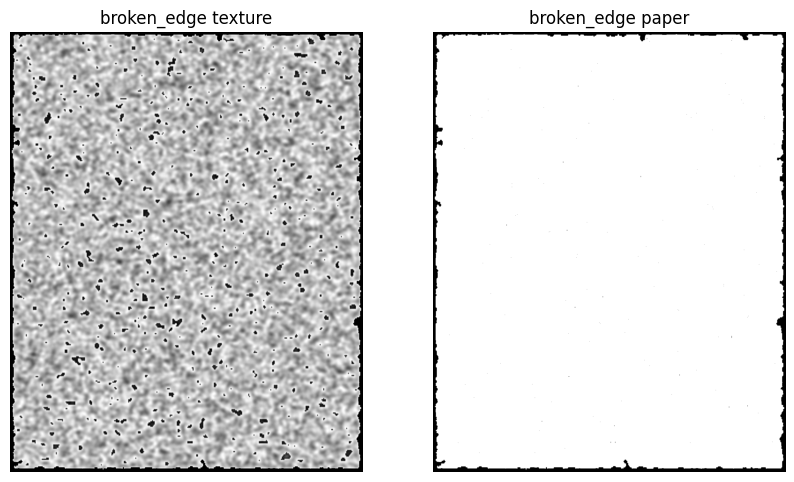

In [6]:
# Example

for i in range(5):
    image_texture = texture_generator(texture_type="broken_edge", texture_width=1200,texture_height=1500, quilt_texture=0)
    image_blank = np.full((1500,1200),fill_value=250, dtype="uint8")
    image_blank[image_texture<=0] = 0

    # display image
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(image_texture, cmap="gray")
    plt.axis('off')
    plt.title("broken_edge texture")

    plt.subplot(1,2,2)
    plt.imshow(image_blank, cmap="gray")
    plt.axis('off')
    plt.title("broken_edge paper")


